## Gadfly.jl
Gadfly is a system for statistical plotting and visualization written in Julia. It is based largely on ggplot2 for R and the book The Grammar of Graphics.

To begin, we need some data. Gadfly can work with data supplied as either a DataFrame or as plain AbstractArrays. 

In [2]:
using Gadfly, RDatasets
iris = dataset("datasets", "iris")

Row,SepalLength,SepalWidth,PetalLength,PetalWidth,Species
,Float64,Float64,Float64,Float64,Cat…
1,5.1,3.5,1.4,0.2,setosa
2,4.9,3.0,1.4,0.2,setosa
3,4.7,3.2,1.3,0.2,setosa
4,4.6,3.1,1.5,0.2,setosa
5,5.0,3.6,1.4,0.2,setosa
6,5.4,3.9,1.7,0.4,setosa
7,4.6,3.4,1.4,0.3,setosa
8,5.0,3.4,1.5,0.2,setosa
9,4.4,2.9,1.4,0.2,setosa


## When used with a DataFrame
The first argument is the data to be plotted and the keyword arguments at the end map "aesthetics" to columns in the data frame. All input arguments between data and mapping are some number of "elements", which are the nouns and verbs, so to speak, that form the grammar.

It can be saved to a file by drawing to one or more backends using draw

In [8]:
println(typeof(iris))
p = plot(iris, x=:SepalLength, y=:SepalWidth, Geom.point);
img = SVG("iris_plot.svg", 14cm, 8cm)
draw(img, p)

DataFrame


false

##### Omit the semi-colon trailing plot. This automatically renders the image to your default multimedia display, typically an internet browser

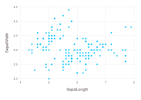

In [6]:
plot(iris, x=:SepalLength, y=:SepalWidth) 
# Geom.point will be automatically supplied if no other geometries are given.

##### Alternatively one can manually call display on a Plot object. This workflow is necessary when display would not otherwise be called automatically.

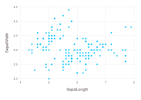

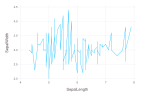

(nothing, nothing)

In [9]:
function get_to_it(d)
  ppoint = plot(d, x=:SepalLength, y=:SepalWidth, Geom.point)
  pline = plot(d, x=:SepalLength, y=:SepalWidth, Geom.line)
  ppoint, pline
end
ps = get_to_it(iris)
map(display, ps)

The last argument in the plot below, Geom.point, is a geometry element which takes bound aesthetics and renders delightful figures.

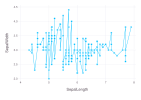

In [10]:
plot(iris, x=:SepalLength, y=:SepalWidth, Geom.point, Geom.line)

##### Adding other geometries produces layers, which may or may not result in a coherent plot.

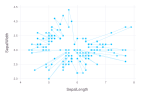

In [11]:
plot(iris, x=:SepalLength, y=:SepalWidth, Geom.point, Geom.polygon)

#### Arrays
If your data is stored in Arrays instead of a DataFrame, fear not, identical plots can be created using an alternate plot signature

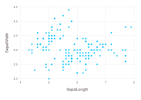

In [12]:
SepalLength = iris.SepalLength
SepalWidth = iris.SepalWidth
plot(x=SepalLength, y=SepalWidth, Geom.point,
     Guide.xlabel("SepalLength"), Guide.ylabel("SepalWidth"))

### Aesthetics
lets give the color mapping some meaining

Color scales in Gadfly by default are produced from perceptually uniform colorspaces, though it supports RGB, HSV, HLS, XYZ, and converts arbitrarily between these.

Color values can also be specified by most names common to CSS or X11, e.g. "oldlace" or "aliceblue". 
The full list of valid color names: https://juliagraphics.github.io/Colors.jl/stable/namedcolors/

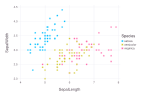

In [13]:
plot(iris, x=:SepalLength, y=:SepalWidth, color=:Species, Geom.point);

# or equivalently for Arrays:
Color = iris.Species
plot(x=SepalLength, y=SepalWidth, color=Color, Geom.point,
     Guide.xlabel("SepalLength"), Guide.ylabel("SepalWidth"),
     Guide.colorkey(title="Species"))

##### Color, and other aesthetics, can also be mapped by using arrays with group labels or functional types

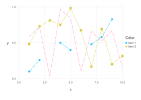

In [14]:
y1 = [0.1, 0.26, NaN, 0.5, 0.4, NaN, 0.48, 0.58, 0.83]
plot(x=1:9, y=y1, Geom.line, Geom.point,
        color=["Item 1"], linestyle=[:dash], size=[3pt],
    layer(x=1:10, y=rand(10), Geom.line, Geom.point,
        color=["Item 2"], size=[5pt], shape=[Shape.square]),
    layer(x=1:10, y=rand(10), color=[colorant"hotpink"],
        linestyle=[[8pt, 3pt, 2pt, 3pt]], Geom.line))

##### All aesthetics have a Scale e.g. Scale.x_continuous() and some have a Guide e.g. Guide.xticks(). Scales can be continuous or discrete. Some Scales also have a corresponding palette in Theme().

### Continuous Scales
Continuous scales can be transformed.

Scale transformations include: _sqrt, _log, _log2, _log10, _asinh for the x, y, color aesthetics, and _area for the size aesthetic.

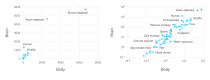

In [15]:
set_default_plot_size(21cm ,8cm)
mammals = dataset("MASS", "mammals")
p1 = plot(mammals, x=:Body, y=:Brain, label=:Mammal, Geom.point, Geom.label)
p2 = plot(mammals, x=:Body, y=:Brain, label=:Mammal, Geom.point, Geom.label,
     Scale.x_log10, Scale.y_log10) # Putting both axes on a log-scale
hstack(p1, p2)

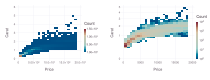

In [16]:
using Printf
Diamonds = dataset("ggplot2","diamonds")
p3= plot(Diamonds, x=:Price, y=:Carat, Geom.histogram2d(xbincount=25, ybincount=25),
    Scale.x_continuous(format=:engineering) )
p4= plot(Diamonds, x=:Price, y=:Carat, Geom.histogram2d(xbincount=25, ybincount=25),
    Scale.x_continuous(format=:plain),
    Scale.y_sqrt(labels=y->@sprintf("%i", y^2)),
    Scale.color_log10(minvalue=1.0, maxvalue=10^4),
    Guide.yticks(ticks=sqrt.(0:5)) )
hstack(p3, p4)

### Discrete Scales

For discrete scales with a Theme palette, the order of levels and the order of the Theme palette match.

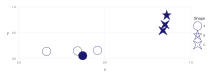

In [17]:
x, y = 0.55*rand(4), 0.55*rand(4)
plot( Coord.cartesian(xmin=0, ymin=0, xmax=1.0, ymax=1.0),
    layer(x=x, y=y, shape=["A"], alpha=["day","day","day","night"]),
    layer(x=1.0.-y[1:3], y=1.0.-x[1:3], shape=["B", "C","C"], alpha=["night"]),
    Scale.shape_discrete(levels=["A","B","C"]),
    Scale.alpha_discrete(levels=["day","night"]),
    Theme(discrete_highlight_color=identity, point_size=12pt,
   point_shapes=[Shape.circle, Shape.star1, Shape.star2], alphas=[0, 1.0],
         default_color="midnightblue" )
)

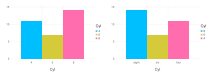

In [18]:
mtcars = dataset("datasets","mtcars")
 labeldict = Dict(4=>"four", 6=>"six", 8=>"eight")
p5 = plot(mtcars, x=:Cyl, color=:Cyl, Geom.histogram,
    Scale.x_discrete(levels=[4,6,8]), Scale.color_discrete(levels=[4,6,8]) )
p6 = plot(mtcars, x=:Cyl, color=:Cyl, Geom.histogram,
    Scale.x_discrete(labels=i->labeldict[i], levels=[8,6,4]),
    Scale.color_discrete(levels=[8,6,4]) )
hstack(p5, p6)

##### If you don't supply Scales or Guides, Gadfly will make an educated guess.

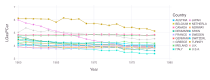

In [19]:
gasoline = dataset("Ecdat", "Gasoline")
plot(gasoline, x=:Year, y=:LGasPCar, color=:Country, Geom.point, Geom.line)
# We could have added Scale.x_discrete explicitly, 
# but this is detected and the right default is chosen. 

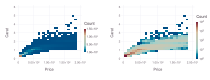

In [23]:
using Printf
Diamonds = dataset("ggplot2","diamonds")
p3= plot(Diamonds, x=:Price, y=:Carat, Geom.histogram2d(xbincount=25, ybincount=25), )
p4= plot(Diamonds, x=:Price, y=:Carat, Geom.histogram2d(xbincount=25, ybincount=25),
    Scale.color_log10(minvalue=1.0, maxvalue=10^4), )
hstack(p3, p4)

### Rendering

Gadfly uses a custom graphics library called Compose, a pure functional take n the R grid package.

Enables mixing of absolute and relative units and complex coordinate transforms. The primary backend is a native SVG generator, though there is also a Cairo backend for PDF and PNG.

**Gadfly supports advanced plot composition techniques like faceting, stacking, and layering.**
- **Facets** make it easy to make multiple plots that all share a common dataset and axis.
- **Subplots** can arrange plots vertically or even in a 2D grid if there are two shared axes.
- **Stacks** allows one to composite disparate plots to be either horizontally or vertically stacked in a gridstack.
- **Layers** enable drawing of multiple layers onto the same plot by inputting Layer objects to plot.

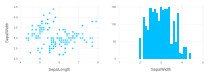

In [24]:
fig1a = plot(iris, x=:SepalLength, y=:SepalWidth, Geom.point)
fig1b = plot(iris, x=:SepalWidth, Geom.bar)
fig1 = hstack(fig1a, fig1b)

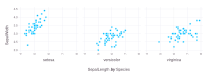

In [25]:
using Gadfly, RDatasets
iris = dataset("datasets", "iris")
plot(iris, xgroup="Species", x="SepalLength", y="SepalWidth",
     Geom.subplot_grid(Geom.point))

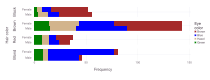

In [26]:
haireye = dataset("datasets", "HairEyeColor")
palette = ["brown", "blue", "tan", "green"]

plot(haireye, y=:Sex, x=:Freq, color=:Eye, ygroup=:Hair,
    Geom.subplot_grid(Geom.bar(position=:stack, orientation=:horizontal),
        Guide.ylabel(orientation=:vertical) ),
    Scale.color_discrete_manual(palette...),
    Guide.colorkey(title="Eye\ncolor"),
    Guide.ylabel("Hair color"), Guide.xlabel("Frequency") )

##### Here we illustrate how to vertically stack them with vstack or arrange them in a grid with gridstack. These commands allow more customization in regards to tick marks, axis labeling, and other plot details than is available with Geom.subplot_grid.

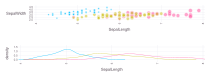

In [27]:
theme1 = Theme(key_position=:none)
fig1a = plot(iris, x=:SepalLength, y=:SepalWidth, color=:Species, theme1,
          alpha=[0.6], size=:PetalLength, Scale.size_area(maxvalue=7))
fig1b = plot(iris, x=:SepalLength, color=:Species, Geom.density,
          Guide.ylabel("density"), Coord.cartesian(xmin=4, xmax=8), theme1)
vstack(fig1a,fig1b)

In [2]:
pi

π = 3.1415926535897...

In [6]:
sin(pi / 2)

1.0

In [5]:
pi/50

0.06283185307179587

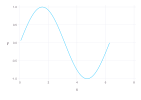

In [12]:
using Gadfly

x = [pi/50*i for i in 1:100]
y = [ sin(i) for i in x]

plot(x=x, y=y, Geom.line)

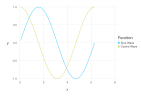

In [17]:
using DataFrames
y_sin = [ sin(i) for i in x]
y_cos = [ cos(i) for i in x]

df1 = DataFrame(x=x, y=y_sin, group="Sine Wave")
df2 = DataFrame(x=x, y=y_cos, group="Cosine Wave")

df = vcat(df1, df2)
plot(df, x=:x, y=:y, color=:group, Geom.line, Guide.colorkey(title="Function"))
